In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
from ipywidgets import interact,interact_manual
import warnings
warnings.filterwarnings("ignore")

In [ ]:
data=pd.read_csv("/content/drive/MyDrive/datasets/newdata1/Cleaned_WeatherAUS.csv")
data.head()

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,8.4,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,4.0,16.9,21.8,No,No
1,1,2008-12-02,Albury,7.4,25.1,0.0,8.4,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,4.0,17.2,24.3,No,No
2,2,2008-12-03,Albury,12.9,25.7,0.0,8.4,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,3,2008-12-04,Albury,9.2,28.0,0.0,8.4,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,4.0,18.1,26.5,No,No
4,4,2008-12-05,Albury,17.5,32.3,1.0,8.4,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
@interact
def Rain_info(RainTomorrow=data["RainTomorrow"].unique(),RainToday=data["RainToday"].unique(),top_N=[10,5,
                                                                                  15,20,25,30,35,40,47]):
  frame=pd.DataFrame()
  for (i,j) in [("WindSpeed9am","WindSpeed3pm"),("Humidity9am","Humidity3pm"),("Pressure9am","Pressure3pm"),	
                                ("Cloud9am","Cloud3pm"),("Temp9am","Temp3pm")]:
                                frame[f'Δ{i.split("9")[0]}']=data[i]-data[j]
  frame[["Location","RainToday","RainTomorrow"]]=data[["Location","RainToday","RainTomorrow"]]
  return frame[(frame["RainToday"]==RainToday) & 
            (frame["RainTomorrow"]==RainTomorrow)].groupby("Location").agg({"ΔTemp":"mean","ΔHumidity":"median",
      "ΔPressure":"median","ΔWindSpeed":"median","ΔCloud":"mean"}).head(top_N).style.background_gradient(cmap="inferno")

interactive(children=(Dropdown(description='RainTomorrow', options=('No', 'Yes'), value='No'), Dropdown(descri…

In [ ]:
frame=pd.DataFrame()
for (i,j) in [("WindSpeed9am","WindSpeed3pm"),("Humidity9am","Humidity3pm"),("Pressure9am","Pressure3pm"),	
                                ("Cloud9am","Cloud3pm"),("Temp9am","Temp3pm")]:
                                frame[f'Δ{i.split("9")[0]}']=data[i]-data[j]
frame[["Location","RainToday","RainTomorrow"]]=data[["Location","RainToday","RainTomorrow"]]

In [ ]:
frame.head()

,ΔWindSpeed,ΔHumidity,ΔPressure,ΔCloud,ΔTemp,Location,RainToday,RainTomorrow
0,-4.0,49.0,0.6,4.0,-4.9,Albury,No,No
1,-18.0,19.0,2.8,1.0,-7.1,Albury,No,No
2,-7.0,8.0,-1.1,3.0,-2.2,Albury,No,No
3,2.0,29.0,4.8,1.0,-8.4,Albury,No,No
4,-13.0,49.0,4.8,-1.0,-11.9,Albury,No,No


In [ ]:
@interact
def LOCATION_INFO(locations=data["Location"].unique()):
  frame[frame["Location"]==locations][["ΔWindSpeed","ΔHumidity","ΔPressure","ΔTemp"]]
  plt.rcParams["figure.figsize"]=(18,6)
  return(
      plt.subplot(1,4,1),
      sns.regplot(frame["ΔWindSpeed"],frame["ΔHumidity"],color="orange"),
      plt.title("ΔWindSpeed vs ΔHumidity"),
      plt.subplot(1,4,2),
      sns.regplot(frame["ΔHumidity"],frame["ΔPressure"]),
      plt.title("ΔHumidity vs ΔPressure"),
      plt.subplot(1,4,3),
      sns.regplot(frame["ΔPressure"],frame["ΔTemp"],color="red"),
      plt.title("ΔPressure vs ΔTemp"),
      plt.subplot(1,4,4),
      sns.regplot(frame["ΔTemp"],frame["ΔWindSpeed"],color="green"),
      plt.title("ΔTemp vs ΔWindSpeed"),
      
      plt.show()
  )

interactive(children=(Dropdown(description='locations', options=('Albury', 'BadgerysCreek', 'Cobar', 'CoffsHar…

In [ ]:
@interact
def LOCATION_INFO(locations=data["Location"].unique()):
  frame[frame["Location"]==locations][["ΔWindSpeed","ΔHumidity","ΔPressure","ΔTemp"]]
  plt.rcParams["figure.figsize"]=(15,5)
  return(
      plt.subplot(1,4,1),
      sns.distplot(frame["ΔHumidity"]),
      plt.title("Distribution of ΔHumidity"),
      plt.subplot(1,4,2),
      sns.distplot(frame["ΔPressure"],color="red"),
      plt.title("Distribution of ΔPressure"),
      plt.subplot(1,4,3),
      sns.distplot(frame["ΔTemp"],color="green"),
      plt.title("Distribution of ΔTemp"),
      plt.subplot(1,4,4),
      sns.distplot(frame["ΔWindSpeed"]),
      plt.title("Distribution of ΔWindSpeed "),
      plt.show()
  )

interactive(children=(Dropdown(description='locations', options=('Albury', 'BadgerysCreek', 'Cobar', 'CoffsHar…

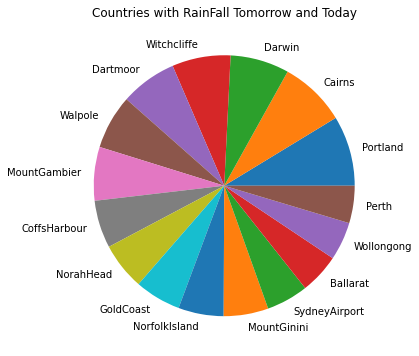

In [ ]:
result=data[(data["RainToday"]=="Yes") & (data["RainTomorrow"]=="Yes")]
plt.rcParams["figure.figsize"]=(15,6)
plt.title("Countries with RainFall Tomorrow and Today")
plt.pie(result.Location.value_counts()[:16].values,labels=result.Location.value_counts()[:16].keys())
plt.show()

In [ ]:
@interact
def rain_info(locations=data["Location"].unique()):
  result=data[data["Location"]==locations]
  plt.rcParams["figure.figsize"]=(15,4)
  return(
      plt.subplot(1,2,1),
      sns.countplot(result["RainToday"]),
      plt.title("Distribution of RainToday"),
      plt.subplot(1,2,2),
      sns.countplot(result["RainTomorrow"]),
      plt.title("Distribution of RainTomorrow"),
      plt.show()
  )


interactive(children=(Dropdown(description='locations', options=('Albury', 'BadgerysCreek', 'Cobar', 'CoffsHar…

In [ ]:
import plotly.express as px
fig = px.scatter_matrix(data, dimensions=["WindSpeed9am", "Humidity9am", "Pressure9am", "Temp9am"], color="RainToday")
fig.show()

In [ ]:
import plotly.express as px
fig = px.scatter_matrix(data, dimensions=["WindSpeed3pm", "Humidity3pm", "Pressure3pm", "Temp3pm"], color="RainToday")
fig.show()

In [ ]:
import plotly.express as px
fig = px.line(data, x="Date", y="Rainfall", color="Location", line_group="Location", hover_name="RainToday",
        line_shape="spline", render_mode="svg")
fig.show()

In [ ]:
import plotly.express as px
fig = px.bar_polar(data, r="Rainfall", theta="Location", color="RainTomorrow", template="plotly_dark",)
fig.show()